In [ ]:
import sys
import os
import warnings
from roboflow import Roboflow
import random
from glob import glob
import cv2
import matplotlib.pyplot as plt
import shutil
import yaml
import albumentations as A
from ultralytics import YOLO
import numpy as np
import pandas as pd
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel
from tqdm import tqdm

sys.stderr = sys.stdout
os.environ["TOKENIZERS_PARALLELISM"] = "false"
warnings.filterwarnings("ignore")

### Importing Forest Data

In [1]:
!pip install -q roboflow

rf = Roboflow(api_key="bFCeZjvdm1jyeb9ud2ak")

project = rf.workspace("waleed-azzi-o5bzp").project("wildfire-detection-3vcvr")

dataset = project.version(1).download("yolov5")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 34.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 87.3 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sigstore 3.6.1 requires rich~=13.0, but you have rich 14.0.0 which is incompatible.
datasets 3.5.0 requires fsspec[http]<=2024.12.0,>=2023.1.0, but you have fsspec 2025.3.2 which is incompatible.
nilearn 0.11.1 requires scikit-learn>=1.4.0, but you have scikit-learn 1.2.2 which is incompatible.
google-colab 1.0.0 requires notebook==6.5.5, but you have notebook 6.5.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
google-

E0000 00:00:1745345995.565900      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745345995.635479      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### Saving and Displaying a few images

Saved 7531 samples to /kaggle/working/wildfire-detection--1/train_small


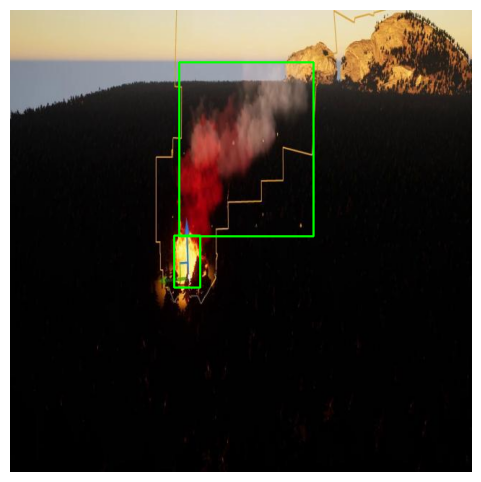

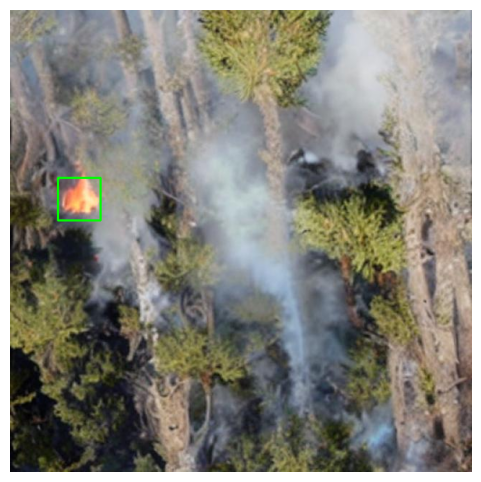

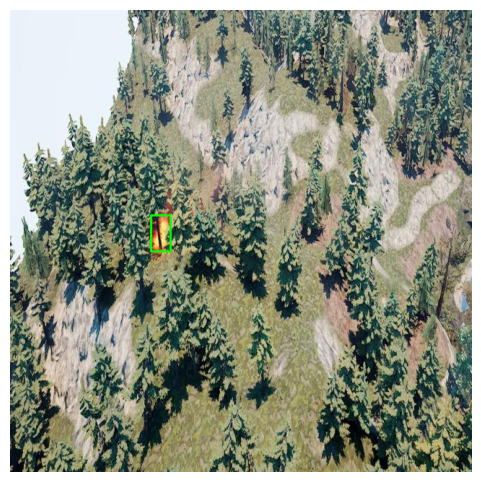

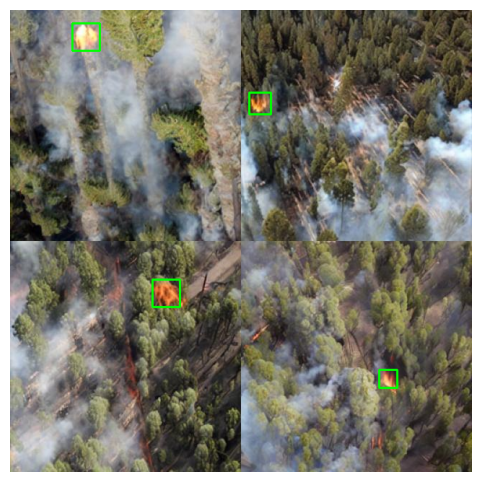

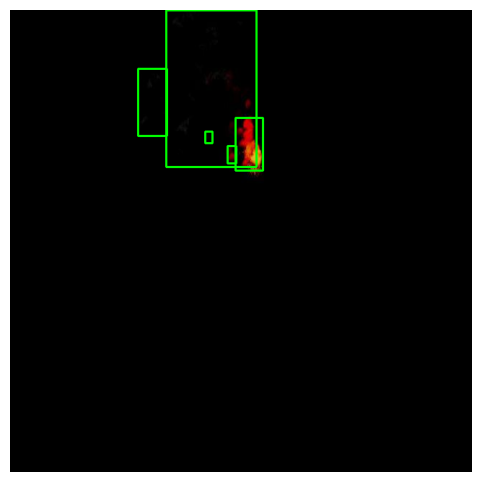

Saved 1215 samples to /kaggle/working/wildfire-detection--1/valid_small


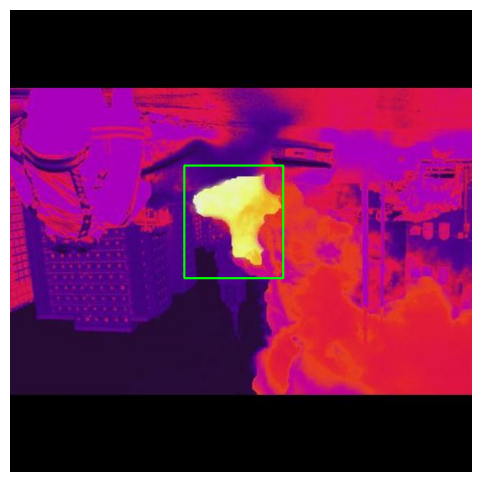

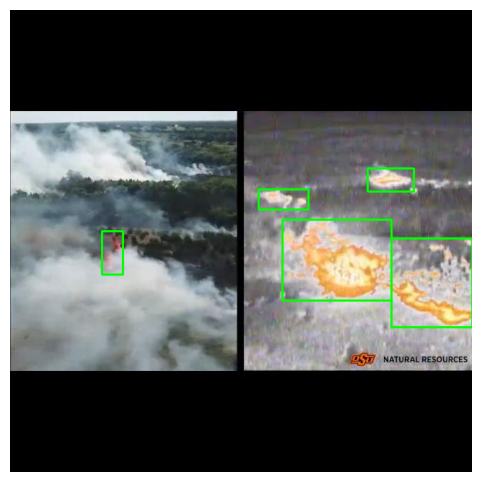

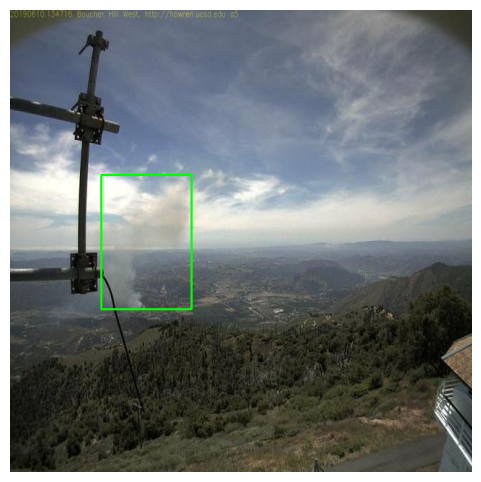

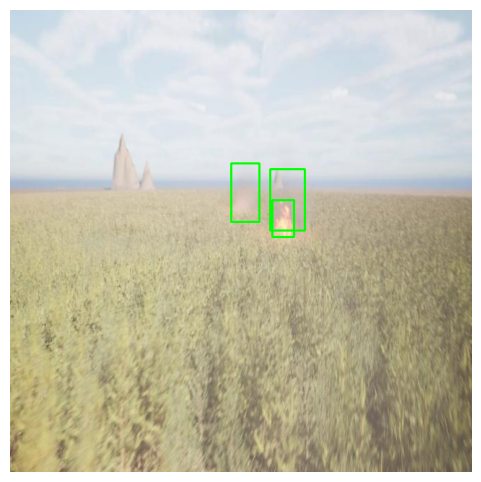

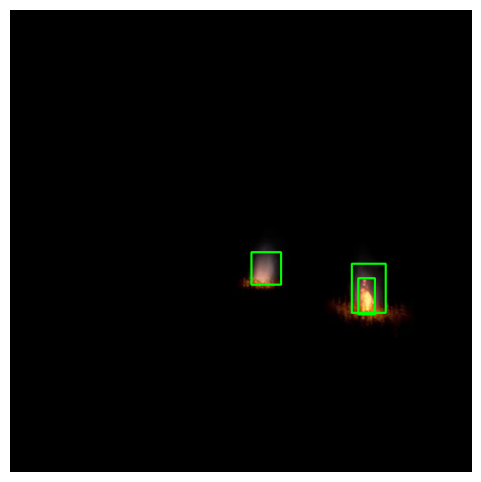

Saved 604 samples to /kaggle/working/wildfire-detection--1/test_small


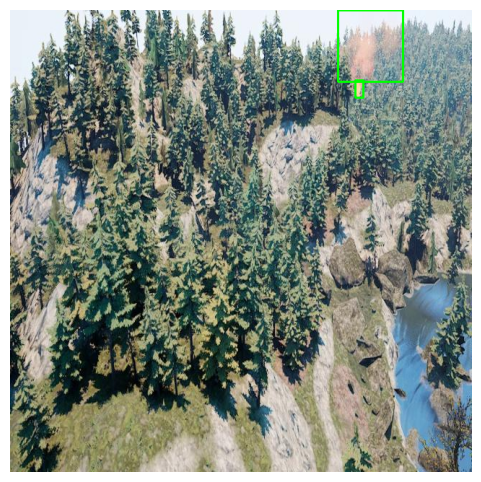

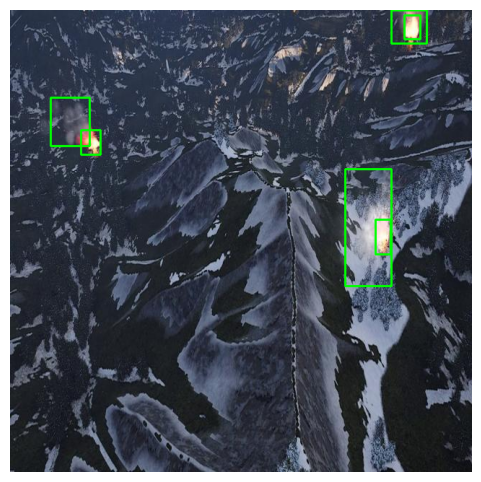

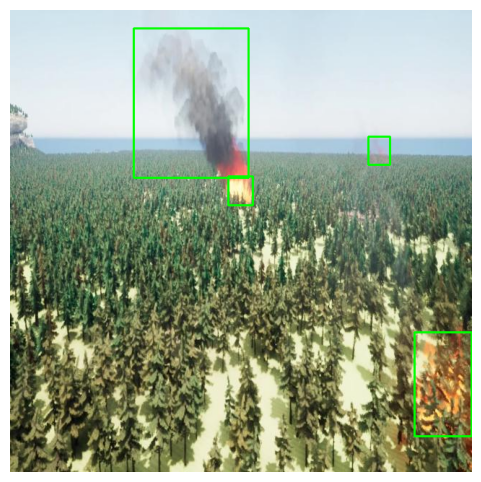

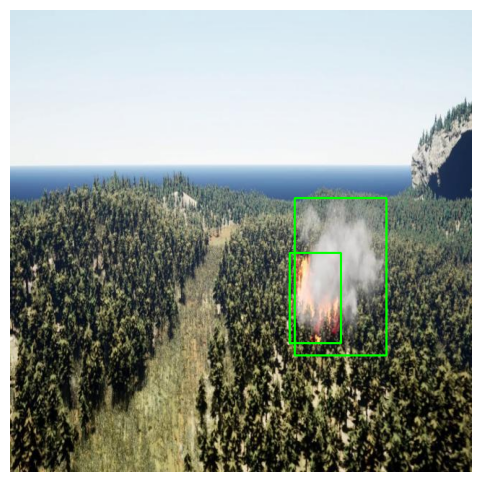

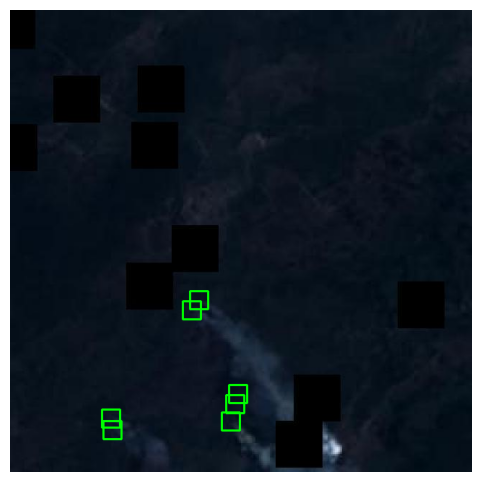

In [2]:
def display_yolo_image(img_path, lbl_path):
    """Display image with YOLO annotations."""
    img = cv2.imread(img_path)
    if img is None:
        print(f"Could not read image: {img_path}")
        return
    h, w = img.shape[:2]
    if os.path.exists(lbl_path):
        with open(lbl_path) as f:
            for line in f:
                cls, x_c, y_c, bw, bh = map(float, line.split())
                x1 = int((x_c - bw/2) * w)
                y1 = int((y_c - bh/2) * h)
                x2 = int((x_c + bw/2) * w)
                y2 = int((y_c + bh/2) * h)
                cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
    else:

        cv2.putText(img, "NO FIRE", (10,30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

def sample_and_display(original_dir, sample_ratio=1, display_n=5, save_copy=False):
    """
    - Samples a fraction of images from original_dir/{images,labels}
    - Copies them into a new folder original_dir+'_small'
    - Displays the first `display_n` with annotations
    """
    img_dir = os.path.join(original_dir, "images")
    lbl_dir = os.path.join(original_dir, "labels")
    out_dir = original_dir + "_small"
    out_img = os.path.join(out_dir, "images")
    out_lbl = os.path.join(out_dir, "labels")

    if os.path.exists(out_dir):
        shutil.rmtree(out_dir)
    os.makedirs(out_img, exist_ok=True)
    os.makedirs(out_lbl, exist_ok=True)

    all_imgs = glob(os.path.join(img_dir, "*.jpg"))
    k = max(1, int(len(all_imgs)*sample_ratio))
    chosen = random.sample(all_imgs, k)

    for img_path in chosen:
        fn = os.path.basename(img_path)
        lbl_path = os.path.join(lbl_dir, fn.replace(".jpg",".txt"))
        shutil.copy(img_path, out_img)
        if os.path.exists(lbl_path):
            shutil.copy(lbl_path, out_lbl)
        else:
            open(os.path.join(out_lbl, fn.replace(".jpg",".txt")), "w").close()

    print(f"Saved {len(chosen)} samples to {out_dir}")
    for img in chosen[:display_n]:
        display_yolo_image(img,
            os.path.join(out_lbl, os.path.basename(img).replace(".jpg",".txt")))

base_path = "/kaggle/working/wildfire-detection--1"
for split in ["train","valid","test"]:
    sample_and_display(os.path.join(base_path, split),
                       sample_ratio=1.0, display_n=5, save_copy=True)


In [3]:
yaml_path = "/kaggle/working/wildfire-detection--1/data.yaml"

try:
    with open(yaml_path, 'r') as file:
        data = yaml.safe_load(file)
    
    print("Class mappings:")
    for i, name in enumerate(data['names']):
        print(f"{i}: {name}")
    
    print("\nFull dataset config:")
    print(data)
except FileNotFoundError:
    print(f"Error: {yaml_path} not found!")
except Exception as e:
    print(f"Error reading YAML file: {e}")

Class mappings:
0: fire
1: smoke

Full dataset config:
{'names': ['fire', 'smoke'], 'nc': 2, 'roboflow': {'license': 'CC BY 4.0', 'project': 'wildfire-detection-3vcvr', 'url': 'https://universe.roboflow.com/waleed-azzi-o5bzp/wildfire-detection-3vcvr/dataset/1', 'version': 1, 'workspace': 'waleed-azzi-o5bzp'}, 'test': '../test/images', 'train': 'wildfire-detection--1/train/images', 'val': 'wildfire-detection--1/valid/images'}


In [4]:
!pip install ultralytics pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 982.4/982.4 kB 17.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 64.0 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found

### Making subsets

In [5]:
def create_subset(original_dir, subset_dir, sample_size=100):
    if os.path.exists(subset_dir):
        shutil.rmtree(subset_dir)

    os.makedirs(os.path.join(subset_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(subset_dir, 'labels'), exist_ok=True)

    img_files = glob(os.path.join(original_dir, 'images', '*.jpg'))
    annotated_imgs = [
        img for img in img_files
        if os.path.exists(img.replace('images', 'labels').replace('.jpg', '.txt'))
    ]

    sampled = random.sample(annotated_imgs, min(sample_size, len(annotated_imgs)))

    for img_path in sampled:

        shutil.copy(img_path, os.path.join(subset_dir, 'images'))

        label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
        shutil.copy(label_path, os.path.join(subset_dir, 'labels'))

base_path = "/kaggle/working/wildfire-detection--1"

create_subset(os.path.join(base_path, 'train'), os.path.join(base_path, 'train_small'), 7500)
create_subset(os.path.join(base_path, 'valid'), os.path.join(base_path, 'valid_small'), 750)
create_subset(os.path.join(base_path, 'test'), os.path.join(base_path, 'test_small'), 375)

def print_dataset_sizes(base_path):
    dirs = ['train', 'train_small', 'valid', 'valid_small']
    for d in dirs:
        img_dir = os.path.join(base_path, d, 'images')
        lbl_dir = os.path.join(base_path, d, 'labels')

        num_imgs = len([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        num_lbls = len(glob(os.path.join(lbl_dir, '*.txt')))

        print(f"\nContents of '{os.path.join(base_path, d)}':")
        print(f"  Images: {num_imgs}")
        print(f"  Labels: {num_lbls}")

        if 'small' in d:
            expected = 550 if 'train' in d else 55
            if num_imgs != expected or num_lbls != expected:
                print(f"  ❌ Error: Expected {expected}, but got {num_imgs} images and {num_lbls} labels.")
            else:
                print("  ✅ Subset size correct.")

print_dataset_sizes(base_path)

base_path = "/kaggle/working/wildfire-detection--1"
nofire_input_path = "/kaggle/input/nofire/nofire"  e
nofire_output_path = os.path.join(base_path, "test_small", "images")
label_output_path = os.path.join(base_path, "test_small", "labels")

os.makedirs(nofire_output_path, exist_ok=True)
os.makedirs(label_output_path, exist_ok=True)

all_nofire_images = [f for f in os.listdir(nofire_input_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_nofire_images = random.sample(all_nofire_images, min(375, len(all_nofire_images)))

for image_name in selected_nofire_images:
    src_img = os.path.join(nofire_input_path, image_name)
    dst_img = os.path.join(nofire_output_path, image_name)

    shutil.copy(src_img, dst_img)

    label_name = os.path.splitext(image_name)[0] + ".txt"
    dst_lbl = os.path.join(label_output_path, label_name)
    open(dst_lbl, 'w').close()

print(f"✅ Added {len(selected_nofire_images)} NoFire images with empty labels to test_small.")


Contents of '/kaggle/working/wildfire-detection--1/train':
  Images: 7531
  Labels: 7531

Contents of '/kaggle/working/wildfire-detection--1/train_small':
  Images: 7500
  Labels: 7500
  ❌ Error: Expected 550, but got 7500 images and 7500 labels.

Contents of '/kaggle/working/wildfire-detection--1/valid':
  Images: 1215
  Labels: 1215

Contents of '/kaggle/working/wildfire-detection--1/valid_small':
  Images: 750
  Labels: 750
  ❌ Error: Expected 55, but got 750 images and 750 labels.
✅ Added 375 NoFire images with empty labels to test_small.


In [6]:
yaml_path = os.path.join(base_path, 'data.yaml')
with open(yaml_path) as f:
    data = yaml.safe_load(f)

data['train'] = os.path.join(base_path, 'train_small')
data['val'] = os.path.join(base_path, 'valid_small')
data['test'] = os.path.join(base_path, 'test_small')

with open(os.path.join(base_path, 'data_small.yaml'), 'w') as f:
    yaml.dump(data, f)

### Augmenting Data

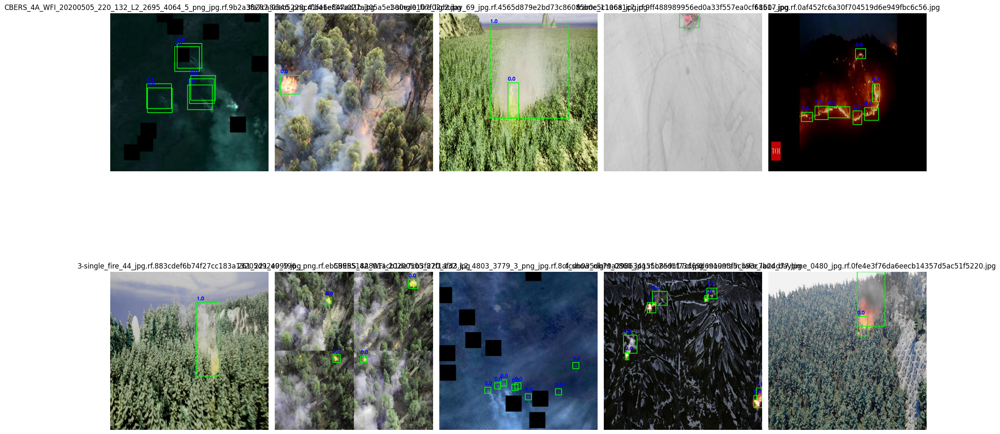

In [7]:
def get_transform(resize_dim=None):
    transforms = [
        A.RandomBrightnessContrast(p=0.2),
        A.CLAHE(clip_limit=4.0, p=0.1),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),

        A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0), max_pixel_value=255.0)
    ]
    
    if resize_dim is not None:
        transforms.append(A.Resize(height=resize_dim, width=resize_dim))

    return A.Compose(
        transforms,
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    )

def draw_bboxes(image, bboxes, class_labels):
    """Draw bounding boxes on image"""
    h, w = image.shape[:2]
    for (xc, yc, bw, bh), cls in zip(bboxes, class_labels):

        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, str(cls), (x1, y1 - 10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
    return image

def augment_and_save(img_path, out_img_dir, out_lbl_dir, transform, sample_images=None):

    lbl_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
    
    image = cv2.imread(img_path)
    h, w = image.shape[:2]

    class_labels, bboxes = [], []
    with open(lbl_path) as f:
        for line in f:
            cls, xc, yc, bw, bh = map(float, line.split())
            class_labels.append(int(cls))
            bboxes.append([xc, yc, bw, bh])

    augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
    aug_img = augmented['image']
    aug_bboxes = augmented['bboxes']
    aug_classes = augmented['class_labels']

    basename = os.path.basename(img_path)
    aug_path = os.path.join(out_img_dir, basename)
    cv2.imwrite(aug_path, aug_img)

    if sample_images is not None and len(sample_images) < 10:
        img_with_boxes = draw_bboxes(aug_img.copy(), aug_bboxes, aug_classes)
        sample_images.append((img_with_boxes, basename))

    out_lbl = os.path.join(out_lbl_dir, basename.replace('.jpg', '.txt'))
    with open(out_lbl, 'w') as f:
        for cls, (xc, yc, bw, bh) in zip(aug_classes, aug_bboxes):
            f.write(f"{cls} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n")

train_img_dir = "/kaggle/working/wildfire-detection--1/train_small/images"
out_img_dir = "/kaggle/working/wildfire-detection--1/train_aug/images"
out_lbl_dir = "/kaggle/working/wildfire-detection--1/train_aug/labels"

os.makedirs(out_img_dir, exist_ok=True)
os.makedirs(out_lbl_dir, exist_ok=True)

sample_images = []

resize_dim = 640
transform = get_transform(resize_dim)

img_paths = glob(os.path.join(train_img_dir, "*.jpg"))
for img_path in img_paths:
    augment_and_save(img_path, out_img_dir, out_lbl_dir, transform, sample_images)

plt.figure(figsize=(20, 15))
for i, (img, title) in enumerate(sample_images[:10], 1):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i)
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

### Fine Tuning of Yolo model 8

In [8]:
model = YOLO('yolov8s.pt')  
print("BASE PATH:", base_path)

results = model.train(
    data=os.path.join(base_path, 'data_small.yaml'),
    epochs=25,
    imgsz=640,
    batch=16,
    name='fire_detection_small',
    exist_ok = True
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100%|██████████| 21.5M/21.5M [00:00<00:00, 153MB/s]
BASE PATH: /kaggle/working/wildfire-detection--1
Ultralytics 8.3.113 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/wildfire-detection--1/data_small.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=fire_detection_small, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_s

### Running pipeline with both clip and yolo models

In [9]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model_name  = "openai/clip-vit-base-patch32"
clip_model  = CLIPModel.from_pretrained(model_name).to(device)
processor   = CLIPProcessor.from_pretrained(model_name)

def classify_with_context(image_path):
    """Classifies an image for fire/non-fire using contextual CLIP queries."""
    try:
        image = Image.open(image_path).convert("RGB")
    except Exception as e:
        print(f"Error loading image: {image_path} - {e}")
        return "ERROR", 0.0

    weather_prompts = [
        "a photo of a sunny forest",
        "a photo of a foggy forest",
        "a photo of a hazy forest",
        "a photo of a clear forest"
    ]
    inputs_weather = processor(text=weather_prompts, images=image, return_tensors="pt", padding="max_length", truncation=True).to(device)
    with torch.no_grad():
        outputs_weather = clip_model(**inputs_weather)
        probs_weather = outputs_weather.logits_per_image.softmax(dim=1)[0].cpu().numpy()
    weather_index = np.argmax(probs_weather)
    weather_condition = weather_prompts[weather_index].split()[-2] 
    weather_confidence = probs_weather[weather_index]

    print(f"Initial Weather Assessment: {weather_condition} (Confidence: {weather_confidence:.2f})")

    artifact_prompts = [
        "a photo with camera glare",
        "a photo without camera glare",
        "a photo with strong sunlight",
        "a photo without strong sunlight"
    ]
    inputs_artifact = processor(text=artifact_prompts, images=image, return_tensors="pt", padding="max_length", truncation=True).to(device)
    with torch.no_grad():
        outputs_artifact = clip_model(**inputs_artifact)
        probs_artifact = outputs_artifact.logits_per_image.softmax(dim=1)[0].cpu().numpy()
    glare_prob = probs_artifact[0]
    sunlight_prob = probs_artifact[2]

    print(f"Glare Probability: {glare_prob:.2f}, Sunlight Probability: {sunlight_prob:.2f}")

    if weather_condition in ["sunny", "clear"] and sunlight_prob < 0.7:
        fire_smoke_prompts = [
            "a photo of a forest with smoke",
            "a photo of a forest with fire",
            "a photo of a forest without fire or smoke"
        ]
        inputs_fire_smoke = processor(text=fire_smoke_prompts, images=image, return_tensors="pt", padding="max_length", truncation=True).to(device)
        with torch.no_grad():
            outputs_fire_smoke = clip_model(**inputs_fire_smoke)
            probs_fire_smoke = outputs_fire_smoke.logits_per_image.softmax(dim=1)[0].cpu().numpy()
        if probs_fire_smoke[0] > 0.5 or probs_fire_smoke[1] > 0.5:
            final_label = "FIRE"
            final_confidence = max(probs_fire_smoke[0], probs_fire_smoke[1])
        else:
            final_label = "NON-FIRE"
            final_confidence = probs_fire_smoke[2]

    elif weather_condition == "foggy" or glare_prob > 0.3 or sunlight_prob > 0.7:
        fire_only_prompts = [
            "a photo of a forest with fire",
            "a photo of a forest without fire"
        ]
        inputs_fire_only = processor(text=fire_only_prompts, images=image, return_tensors="pt", padding="max_length", truncation=True).to(device)
        with torch.no_grad():
            outputs_fire_only = clip_model(**inputs_fire_only)
            probs_fire_only = outputs_fire_only.logits_per_image.softmax(dim=1)[0].cpu().numpy()
        if probs_fire_only[0] > 0.5:
            final_label = "FIRE"
            final_confidence = probs_fire_only[0]
        else:
            final_label = "NON-FIRE"
            final_confidence = probs_fire_only[1]

    elif weather_condition == "hazy":
        haze_smoke_prompts = [
            "a photo of a forest with smoke",
            "a photo of a forest with fire",
            "a photo of a hazy forest without fire or smoke"
        ]
        inputs_haze_smoke = processor(text=haze_smoke_prompts, images=image, return_tensors="pt", padding="max_length", truncation=True).to(device)
        with torch.no_grad():
            outputs_haze_smoke = clip_model(**inputs_haze_smoke)
            probs_haze_smoke = outputs_haze_smoke.logits_per_image.softmax(dim=1)[0].cpu().numpy()
        if probs_haze_smoke[0] > 0.5 or probs_haze_smoke[1] > 0.5:
            final_label = "FIRE"
            final_confidence = max(probs_haze_smoke[0], probs_haze_smoke[1])
        else:
            final_label = "NON-FIRE"
            final_confidence = probs_haze_smoke[2]

    else:
        fire_nonfire_prompts = [
            "a photo of a forest with fire or smoke",
            "a photo of a forest without fire or smoke"
        ]
        inputs_default = processor(text=fire_nonfire_prompts, images=image, return_tensors="pt", padding="max_length", truncation=True).to(device)
        with torch.no_grad():
            outputs_default = clip_model(**inputs_default)
            probs_default = outputs_default.logits_per_image.softmax(dim=1)[0].cpu().numpy()
        final_label = "FIRE" if np.argmax(probs_default) == 0 else "NON-FIRE"
        final_confidence = probs_default[np.argmax(probs_default)]

    return final_label, final_confidence

image_dir = "/kaggle/working/wildfire-detection--1/test_small/images"  
image_paths = glob(os.path.join(image_dir, "*.jpg"))
results = []

for img_path in tqdm(image_paths, desc="Classifying Images with Contextual CLIP"):
    predicted_label, confidence = classify_with_context(img_path)
    filename = os.path.basename(img_path)
    results.append({
        "filename": filename,
        "predicted_label": predicted_label,
        "confidence": confidence
    })

df_results = pd.DataFrame(results)
print("\nCLIP Contextual Inference Results:")
print(df_results)


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]


Classifying Images with Contextual CLIP:   0%|          | 0/750 [00:00<?, ?it/s]Initial Weather Assessment: clear (Confidence: 0.95)
Glare Probability: 0.06, Sunlight Probability: 0.43

Classifying Images with Contextual CLIP:   0%|          | 1/750 [00:00<01:55,  6.49it/s]Initial Weather Assessment: clear (Confidence: 0.89)
Glare Probability: 0.33, Sunlight Probability: 0.19
Initial Weather Assessment: clear (Confidence: 0.88)
Glare Probability: 0.20, Sunlight Probability: 0.11

Classifying Images with Contextual CLIP:   0%|          | 3/750 [00:00<01:17,  9.69it/s]Initial Weather Assessment: clear (Confidence: 0.88)
Glare Probability: 0.53, Sunlight Probability: 0.12
Initial Weather Assessment: hazy (Confidence: 0.51)
Glare Probability: 0.38, Sunlight Probability: 0.12

Classifying Images with Contextual CLIP:   1%|          | 5/750 [00:00<01:08, 10.82it/s]Initial Weather Assessment: clear (Confidence: 0.56)
Glare Probability: 0.79, Sunlight Probability: 0.02
Initial Weather Assessm

### Infering using best model

In [10]:
model = YOLO('runs/detect/fire_detection_small/weights/best.pt')

metrics = model.val(
    data=os.path.join(base_path, 'data_small.yaml'),  
    imgsz=640, 
    batch=16
)

print(f"mAP50: {metrics.box.map50:.4f}")  
print(f"mAP50-95: {metrics.box.map:.4f}") 

Ultralytics 8.3.113 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1556.6±482.7 MB/s, size: 55.9 KB)
val: Scanning /kaggle/working/wildfire-detection--1/valid_small/labels.cache... 750 images, 0 backgrounds, 0 corrupt: 100%|██████████| 750/750 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:11<00:00,  4.14it/s]
                   all        750       2382      0.793      0.769      0.842      0.504
                  fire        585       1483      0.808      0.711      0.804      0.455
                 smoke        473        899      0.778      0.828      0.881      0.554
Speed: 0.6ms preprocess, 10.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val
mAP50: 0.8423
mAP50-95: 0.5044


we got a decent value of mAP50 of 84%, Box Precision of 79% and Recall of 77%. mAP50-95 is a harder metric so it is lower than the rest but upon checking with state-of-art papers it is usually lower than the rest.


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/f-69-_jpg.rf.2b08dd206412738588389ce2dcabef55.jpg: 640x640 7 fires, 16.2ms
Speed: 1.5ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


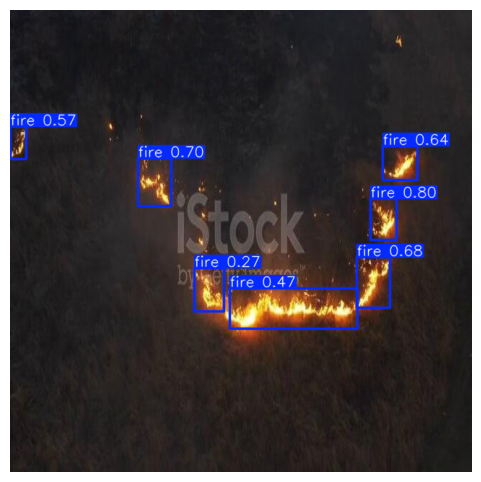


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/2-multi_object_day_214_jpg.rf.f2e5dbdfc60a9cd207a11ccacbfde81d.jpg: 640x640 3 fires, 2 smokes, 16.4ms
Speed: 2.1ms preprocess, 16.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


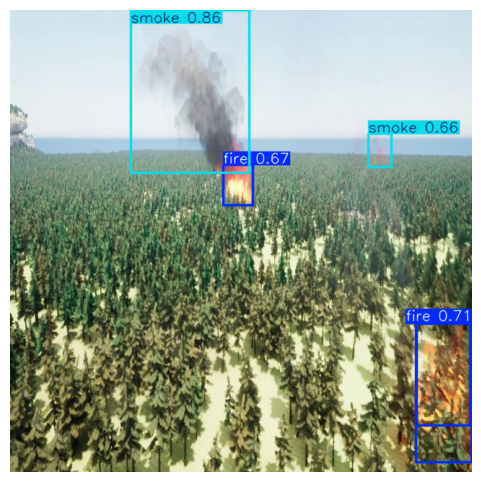


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/nofire_0042.jpg: 640x640 (no detections), 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


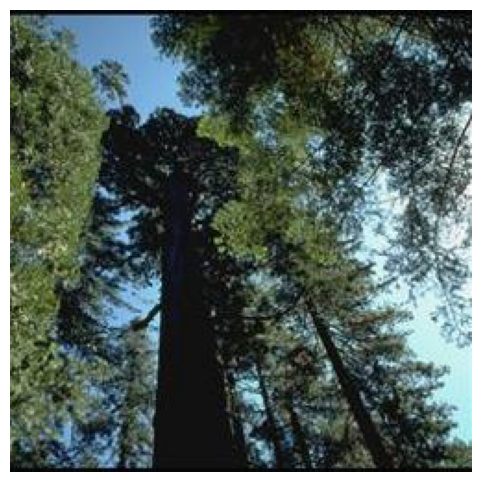


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/nofire_0474.jpg: 640x640 (no detections), 16.4ms
Speed: 2.6ms preprocess, 16.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


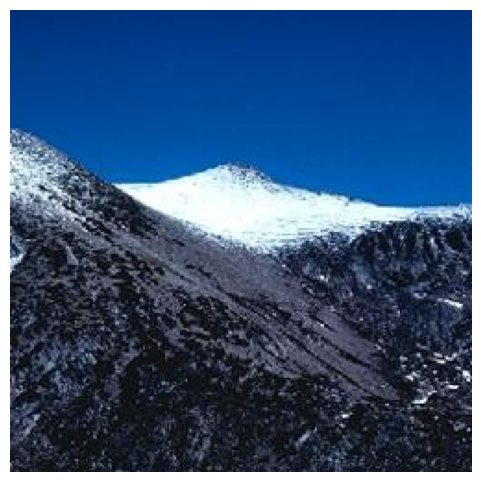


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/44_134_45_142__png.rf.f2614fbbb3674986deb8501edf607dd0.jpg: 640x640 4 fires, 16.5ms
Speed: 2.2ms preprocess, 16.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


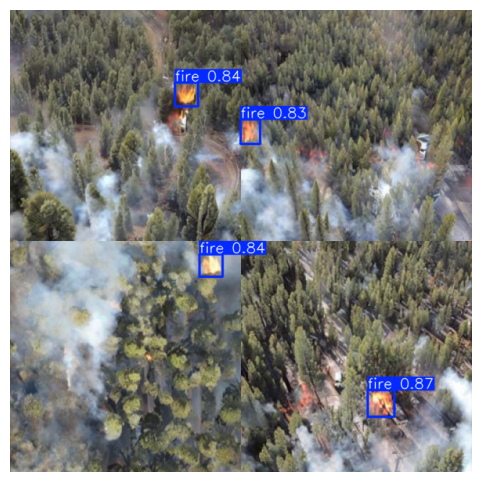

In [12]:
best = YOLO('runs/detect/fire_detection_small/weights/best.pt')

samples = glob.glob(os.path.join(base_path,'test_small','images','*.jpg'))
for img in random.sample(samples, min(5,len(samples))):
    result = best.predict(img, conf=0.2)[0]
    vis = result.plot()
    plt.figure(figsize=(6,6))
    plt.imshow(vis[...,::-1])
    plt.axis('off')
    plt.show()